<a href="https://colab.research.google.com/github/146790g/VGG16-BreakHis/blob/master/Breast_Cancer_Imaging_Data_Fine_Tuning_VGG16_classification_with_All_Combined_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 深層学習 VGG16モデルのファイン・チューニング法を用いた乳がん染色画像の解析
##  Deep Learning for Magnification Independent Breast Cancer Histopathology
## Image Classification

４つのMagnification levelのデータをすべて合算して、解析する

<br>

## 4 Magnification Levels: ×40, ×100, ×200, ×400


During analysis and annotation, pathologists starts by identifying ROIs in
the lowest magnification level slide (×40), then dives deeper in the latter using higher magnification levels (×100, ×200) until having a profound insight
(×400). 

<br>

## データ数 の概要

・Training Data: 5026 images <br>
  -- Benign Data: 1472 images <br>
  -- Mallignant Data: 3554 images 

・Validation Data: 2904 images <br>
  -- Benign Data: 1008 images <br>
  -- Mallignant Data:1896 images <br>

## Data Set Details by Magnification levels.

 ×40 : <br>
×100 : <br>
×200 : <br>
×400 : <br>

In [3]:
%tensorflow_version 2.x

In [4]:
%pwd
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [5]:
!ls -lh '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data'

total 8.0K
drwx------ 2 root root 4.0K Jul 21 03:42 train
drwx------ 2 root root 4.0K Jul 27 01:49 validation


In [ ]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator,load_img
import numpy as np
import os
#import Pillow
#from PIL import Image
#import opencv
from PIL import Image
from keras.preprocessing.image import load_img, save_img, img_to_array, array_to_img
import numpy as np
from pandas import DataFrame
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, models, initializers

from keras.models import Sequential, Model
from keras.layers import Input, Activation, Dropout, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
import numpy as np




#num_train = 1000              # 訓練データの画像数
#num_validation = 1000          # テストデータの画像数

img_h, img_w = 400,400
channels = 3
batch_size = 30               # ミニバッチのサイズ
train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # 訓練データのフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # テストデータのフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG16の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
    


Using TensorFlow backend.


In [ ]:
normal_files = os.listdir(os.path.join(validation_data_dir,'benign'))
print(len(normal_files))
#1008
pneumonia_files = os.listdir(os.path.join(validation_data_dir,'malignant'))
print(len(pneumonia_files))
#1896

1008
1896


validation用のデータには、正常の画像が、１００８画像、乳がん患者の画像が、１８９６画像が含まれている。


##第１章　訓練データ、テストデータの画像の視察的チェック
それぞれ、１２枚を選んできて、画像を視察的に確認する

['benign', 'malignant']
1472
3554
['SOB_B_F-14-14134E-200-017.png', 'SOB_B_F-14-14134E-40-001.png', 'SOB_B_F-14-14134E-200-018.png', 'SOB_B_F-14-14134E-200-011.png', 'SOB_B_F-14-14134E-400-003.png', 'SOB_B_F-14-14134E-40-018.png', 'SOB_B_F-14-14134E-40-024.png', 'SOB_B_F-14-14134E-40-022.png', 'SOB_B_F-14-14134E-40-021.png', 'SOB_B_F-14-14134E-40-027.png', 'SOB_B_F-14-14134E-40-029.png', 'SOB_B_F-14-14134E-40-019.png']
['SOB_M_DC-14-20629-40-005.png', 'SOB_M_DC-14-20629-40-006.png', 'SOB_M_DC-14-20629-40-008.png', 'SOB_M_DC-14-20629-40-009.png', 'SOB_M_DC-14-20629-40-010.png', 'SOB_M_DC-14-20629-40-007.png', 'SOB_M_DC-14-20629-40-012.png', 'SOB_M_DC-14-20629-40-011.png', 'SOB_M_DC-14-20629-40-013.png', 'SOB_M_DC-14-20629-40-014.png', 'SOB_M_DC-14-20629-40-015.png', 'SOB_M_DC-14-20629-40-017.png']
460
700
(460,700)


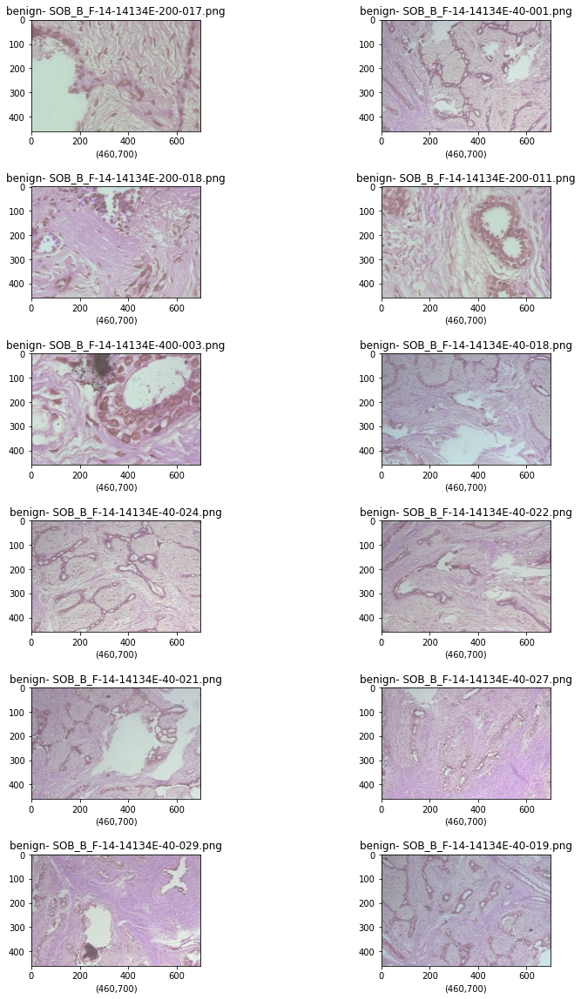

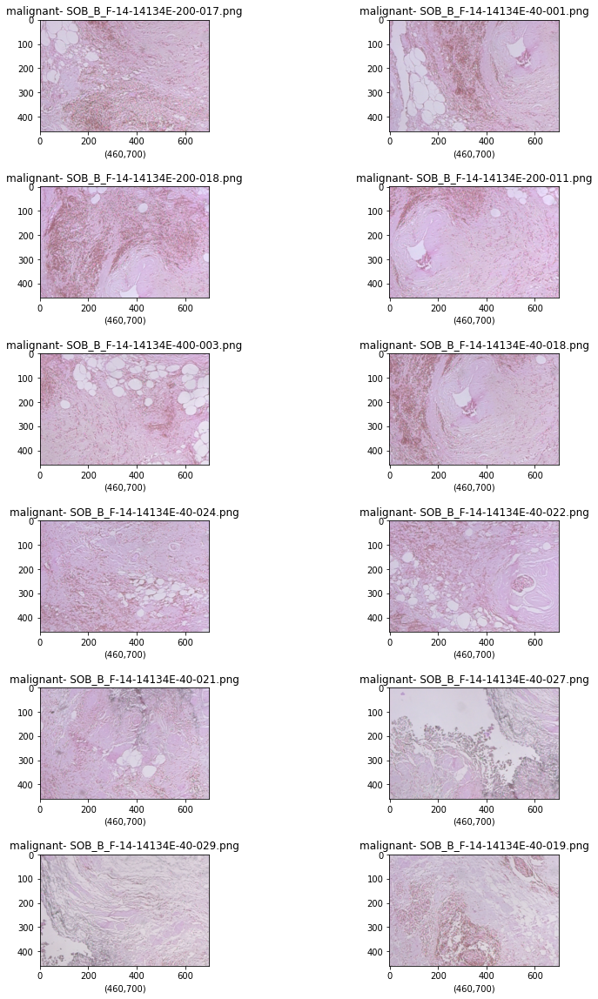

In [ ]:
import cv2

# !ls -lh '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train'

files=os.listdir(train_data_dir)
print(files)

normal_files = os.listdir(os.path.join(train_data_dir,'benign'))
print(len(normal_files))
#1472
pneumonia_files = os.listdir(os.path.join(train_data_dir,'malignant'))
print(len(pneumonia_files))
#3554
#total : 5026



normal_files = os.listdir(os.path.join(train_data_dir,'benign'))[:12]
print(normal_files)

pneumonia_files = os.listdir(os.path.join(train_data_dir,'malignant'))[:12]
print(pneumonia_files)

img = cv2.imread(os.path.join(train_data_dir,'benign',normal_files[3]))
#type(img)
print(img.shape[0])
print(img.shape[1])
a='('+str(img.shape[0])+','+str(img.shape[1])+')'
print(a)
#cv2.imshow('image',img)

import numpy as np
import cv2
from matplotlib import pyplot as plt

%matplotlib inline

fig = plt.figure(figsize=(12,20))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i in range(12):
  img = cv2.imread(os.path.join(train_data_dir,'benign',normal_files[i]))
  ax = fig.add_subplot(6,2,i+1)
  ax.set_title('benign'+'- '+normal_files[i])
  a='('+str(img.shape[0])+','+str(img.shape[1])+')'
  ax.set_xlabel(a)
  ax.imshow(img)
plt.show()

fig = plt.figure(figsize=(12,20))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i in range(12):
  img = cv2.imread(os.path.join(train_data_dir,'malignant',pneumonia_files[i]))
  ax = fig.add_subplot(6,2,i+1)
  ax.set_title('malignant'+'- '+normal_files[i])
  a='('+str(img.shape[0])+','+str(img.shape[1])+')'
  ax.set_xlabel(a)
  ax.imshow(img)
plt.show()


##第２章　訓練データ、テストデータの画像のサイズをチェック

乳がん患者の画像から、ランダムに３００枚を抽出してきて、その画像のサイズを
プロットする。

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import pandas as pd
import os
import pandas as pd
import pickleshare

%matplotlib inline



train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train'
malignant_files = os.listdir(os.path.join(train_data_dir,'malignant'))
key=np.random.choice(range(len(malignant_files)),300)
malignant_files2=[malignant_files[s] for s in key]
print(malignant_files2)

'benign'

x2=[]
y2=[]

for i in range(300):
  img = cv2.imread(os.path.join(train_data_dir,'malignant', malignant_files2[i]))
  x2.append(img.shape[0])
  y2.append(img.shape[1])

malignant_image_size=pd.DataFrame([x2,y2])

result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results' 
malignant_image_size.to_pickle(os.path.join(result_dir,'malignant_image_size.pkl'))

['SOB_M_PC-14-12465-200-015.png', 'SOB_M_LC-14-15570C-200-014 (1).png', 'SOB_M_DC-14-5695-40-020.png', 'SOB_M_LC-14-15570C-100-013.png', 'SOB_M_DC-14-9461-200-036.png', 'SOB_M_DC-14-2985-40-020.png', 'SOB_M_DC-14-17901-100-005.png', 'SOB_M_DC-14-20629-100-003.png', 'SOB_M_DC-14-16336-100-017.png', 'SOB_M_DC-14-4372-100-008.png', 'SOB_M_DC-14-5694-100-018.png', 'SOB_M_PC-14-19440-40-011.png', 'SOB_M_PC-14-12465-400-009.png', 'SOB_M_DC-14-9461-200-029.png', 'SOB_M_PC-14-19440-200-019.png', 'SOB_M_DC-14-2773-400-002.png', 'SOB_M_DC-14-14926-400-003.png', 'SOB_M_MC-14-10147-200-012.png', 'SOB_M_DC-14-10926-40-004.png', 'SOB_M_DC-14-20629-400-017.png', 'SOB_M_DC-14-16875-40-006.png', 'SOB_M_DC-14-4372-40-015.png', 'SOB_M_DC-14-13412-40-018.png', 'SOB_M_MC-14-12773-200-019.png', 'SOB_M_DC-14-13412-400-023.png', 'SOB_M_DC-14-13993-200-009.png', 'SOB_M_DC-14-13412-40-021.png', 'SOB_M_DC-14-13412-40-014.png', 'SOB_M_MC-14-12773-200-016.png', 'SOB_M_DC-14-16601-100-001.png', 'SOB_M_DC-14-14946-2

### validationデータの中から、ランダムに、２０個の画像を抽出して、testフォルダ移動する。このtestデータは、モデル構築後のモデル診断に利用する。

benignの画像をvalidationのディレクトリから、testのディレクトリにコピーして、移動する

In [8]:
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation'
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'

import os
import numpy as np
import shutil

files_normal=os.listdir(os.path.join(validation_data_dir,'benign'))

files_normal1=[f for f in files_normal if f.endswith(r".png")]

key=np.random.choice(range(len(files_normal1)),20)
files_normal2=[files_normal1[s] for s in key]

print(files_normal2)

# test
for p in files_normal2:
    shutil.copy(os.path.join(validation_data_dir, 'benign',p), os.path.join(test_dir,'benign'))



['SOB_B_A-14-22549G-200-029.png', 'SOB_B_PT-14-21998AB-200-047.png', 'SOB_B_TA-14-15275-400-007.png', 'SOB_B_PT-14-21998AB-40-018.png', 'SOB_B_F-14-21998CD-400-020.png', 'SOB_B_A-14-29960CD-400-010.png', 'SOB_B_A-14-22549G-200-028.png', 'SOB_B_F-14-9133-200-003.png', 'SOB_B_F-14-9133-400-001.png', 'SOB_B_TA-14-3411F-100-002.png', 'SOB_B_A-14-29960CD-40-008.png', 'SOB_B_F-14-21998CD-100-018.png', 'SOB_B_PT-14-21998AB-400-015.png', 'SOB_B_TA-14-16184-40-013.png', 'SOB_B_PT-14-21998AB-400-021.png', 'SOB_B_F-14-21998CD-400-008.png', 'SOB_B_A-14-22549G-400-008.png', 'SOB_B_PT-14-21998AB-100-066.png', 'SOB_B_F-14-21998CD-40-011.png', 'SOB_B_A-14-29960CD-40-014.png']


malignantの画像をvalidationのディレクトリから、testのディレクトリにコピーして、移動する

In [9]:

validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation'
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'

import os
import numpy as np
import shutil

files_malignant=os.listdir(os.path.join(validation_data_dir,'malignant'))

files_malignant1=[f for f in files_malignant if f.endswith(r".png")]

key=np.random.choice(range(len(files_malignant1)),20)
files_malignant2=[files_malignant1[s] for s in key]

print(files_malignant2)

# test
for p in files_malignant2:
    shutil.copy(os.path.join(validation_data_dir, 'malignant',p), os.path.join(test_dir,'malignant'))


['SOB_M_LC-14-13412-400-024.png', 'SOB_M_DC-14-2980-400-009.png', 'SOB_M_DC-14-2523-100-033.png', 'SOB_M_LC-14-13412-200-011.png', 'SOB_M_DC-14-18650-400-025.png', 'SOB_M_DC-14-6241-200-012.png', 'SOB_M_DC-14-17614-100-004.png', 'SOB_M_DC-14-18650-400-012.png', 'SOB_M_LC-14-15570-200-039.png', 'SOB_M_DC-14-3909-400-002.png', 'SOB_M_DC-14-11951-40-020.png', 'SOB_M_DC-14-2980-200-016.png', 'SOB_M_DC-14-18650-400-016.png', 'SOB_M_DC-14-3909-200-007.png', 'SOB_M_MC-14-13413-400-005.png', 'SOB_M_LC-14-15570-100-025.png', 'SOB_M_DC-14-17915-100-009.png', 'SOB_M_PC-14-15704-100-014.png', 'SOB_M_DC-14-17614-40-038.png', 'SOB_M_PC-14-15687B-400-014.png']


In [ ]:
normal_files3=[]

for f in normal_files2:
  normal_files3.append( os.path.join(validation_data_dir,'benign'),f))


test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'


import shutil 

for p in normal_files2:
  shutil.move(p,test_dir)

In [ ]:
train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation'
malignant_files = os.listdir(os.path.join(train_data_dir,'malignant'))
key=np.random.choice(range(len(malignant_files)),20)
malignant_files2=[malignant_files[s] for s in key]
print(malignant_files2)

['SOB_M_LC-14-13412-400-024.png', 'SOB_M_DC-14-2980-40-017.png', 'SOB_M_LC-14-15570-200-049.png', 'SOB_M_DC-14-2980-100-010.png', 'SOB_M_DC-14-16716-400-005.png', 'SOB_M_DC-14-20636-100-012.png', 'SOB_M_MC-14-19979C-100-009.png', 'SOB_M_DC-14-17915-200-009.png', 'SOB_M_DC-14-2980-100-011.png', 'SOB_M_DC-14-11520-200-010.png', 'SOB_M_PC-14-15704-400-023.png', 'SOB_M_DC-14-17614-400-024.png', 'SOB_M_PC-14-15704-100-013.png', 'SOB_M_DC-14-11951-200-028.png', 'SOB_M_PC-14-15687B-200-005.png', 'SOB_M_DC-14-2980-100-008.png', 'SOB_M_PC-14-15704-400-019.png', 'SOB_M_DC-14-16716-100-001.png', 'SOB_M_DC-14-11951-200-017.png', 'SOB_M_DC-14-11520-200-009.png']


健康成人の画像から、ランダムに３００枚を抽出してきて、その画像のサイズを
プロットする。

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import pandas as pd
import pandas as pd
import pickleshare


%matplotlib inline

normal_files = os.listdir(os.path.join(train_data_dir,'benign'))
print(len(normal_files))
#1472


train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train'
normal_files = os.listdir(os.path.join(train_data_dir,'benign'))
key=np.random.choice(range(len(normal_files)),300)
normal_files2=[normal_files[s] for s in key]
print(normal_files2)

x=[]
y=[]

for i in range(300):
  img = cv2.imread(os.path.join(train_data_dir,'benign',normal_files[i]))
  x.append(img.shape[0])
  y.append(img.shape[1])

print(x[:10])

normal_image_size=pd.DataFrame([x,y])
normal_image_size.to_pickle(os.path.join(result_dir,'normal_image_size.pkl'))


1472
['SOB_B_TA-14-16184CD-40-028.png', 'SOB_B_F-14-23060AB-40-001.png', 'SOB_B_PT-14-22704-400-007.png', 'SOB_B_TA-14-16184CD-200-006.png', 'SOB_B_F-14-21998EF-40-009.png', 'SOB_B_PT-14-22704-400-023.png', 'SOB_B_PT-14-29315EF-40-013.png', 'SOB_B_F-14-29960AB-400-016.png', 'SOB_B_TA-14-19854C-100-009.png', 'SOB_B_F-14-25197-200-055.png', 'SOB_B_TA-14-13200-40-007.png', 'SOB_B_F-14-14134-40-017.png', 'SOB_B_F-14-14134-100-023.png', 'SOB_B_A-14-22549CD-200-022.png', 'SOB_B_TA-14-16184CD-400-026.png', 'SOB_B_TA-14-21978AB-100-004.png', 'SOB_B_TA-14-16184CD-400-025.png', 'SOB_B_F-14-14134-400-023.png', 'SOB_B_TA-14-16184CD-40-029.png', 'SOB_B_TA-14-16184CD-200-017.png', 'SOB_B_TA-14-13200-40-001.png', 'SOB_B_A-14-22549AB-100-013.png', 'SOB_B_A-14-22549AB-200-008.png', 'SOB_B_F-14-14134-40-016.png', 'SOB_B_A-14-22549CD-400-030.png', 'SOB_B_TA-14-16184CD-200-004.png', 'SOB_B_PT-14-22704-200-020.png', 'SOB_B_TA-14-16184CD-100-026.png', 'SOB_B_PT-14-22704-100-035.png', 'SOB_B_A-14-22549CD-400

456
460
700
700


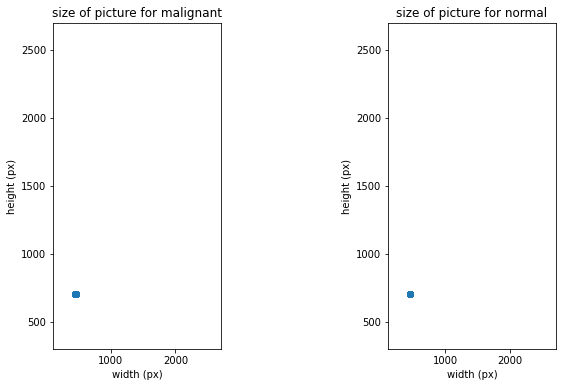

In [ ]:
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results' 
df_malignant = pd.read_pickle(os.path.join(result_dir,'malignant_image_size.pkl'))
df_normal = pd.read_pickle(os.path.join(result_dir,'normal_image_size.pkl'))

import numpy as np
from matplotlib import pyplot as plt

%matplotlib inline

fig = plt.figure(figsize=(9,6))
plt.subplots_adjust(wspace=1)
ax1=fig.add_subplot(1,2,1)

min1=min(df_malignant.iloc[0,].append(df_normal.iloc[0,]))
max1=max(df_malignant.iloc[0,].append(df_normal.iloc[0,]))
print(min1)
print(max1)

min2=min(df_malignant.iloc[1,].append(df_normal.iloc[1,]))
max2=max(df_malignant.iloc[1,].append(df_normal.iloc[1,]))
print(min2)
print(max2)

ax1.set_title('size of picture for malignant')
ax1.set_xlabel('width (px)')
ax1.set_ylabel('height (px)')
ax1.set_xlim(120,2700)
ax1.set_ylim(300,2700)
ax1.scatter(df_malignant.iloc[0,],df_malignant.iloc[1,])

ax2=fig.add_subplot(1,2,2)

ax2.set_title('size of picture for normal')
ax2.set_xlabel('width (px)')
ax2.set_ylabel('height (px)')
ax2.set_xlim(120,2700)
ax2.set_ylim(300,2700)
ax2.scatter(df_normal.iloc[0,],df_normal.iloc[1,])

plt.show()

In [ ]:
normal_min_x=min(df_normal.iloc[0,])
normal_max_x=max(df_normal.iloc[0,])
malignant_min_x=min(df_malignant.iloc[0,])
malignant_max_x=max(df_malignant.iloc[0,])
print(normal_min_x)
print(normal_max_x)
print(malignant_min_x)
print(malignant_max_x)

min2=min(df_normal.iloc[1,])
max2=max(df_malignant.iloc[1,])

normal_min_y=min(df_normal.iloc[1,])
normal_max_y=max(df_normal.iloc[1,])
malignant_min_y=min(df_malignant.iloc[1,])
malignant_max_y=max(df_malignant.iloc[1,])
print(normal_min_y)
print(normal_max_y)
print(malignant_min_y)
print(malignant_max_y)

460
460
456
460
700
700
700
700


### 【考察】
乳がん患者の染色画像と、健康成人の染色画像のサイズは、ほぼ同程度であった。
健康成人の画像は、横のサイズは、いずれも460pxであった。縦のサイズは、いずれも700pxであった。

乳癌患者の画像は、横のサイズは、456から460pxの間であった。縦のサイズは、いずれも700 pxであった。

健康成人の画像と乳がん患者の画像が、同程度の画素数のため、モデル構築には有用であることが確認された。


##第３章　VGG16とFC層を結合したモデルの構築
 ファインチューニング法を用いる  
VGG16モデルのうち、ブロック５を学習可能として、さらに、FC層は、独自で新規にモデルを構築する。

In [ ]:
 ## VGG16モデルと学習済み重みを読み込む

 img_h, img_w = 400,400
channels = 3
batch_size = 30  


vgg16_model = VGG16(include_top=False,        # 全結合層は層（FC）は読み込まない
                    weights='imagenet',       # ImageNetで学習した重みを利用
                    input_shape=(img_h, img_w, channels) # 入力データの形状
                   )
# VGG16モデルのサマリを出力
print('VGG16モデルのサマリ')
vgg16_model.summary()

# VGG16のblock1_conv1からblock4_poolまでを凍結
# block5のみを学習可能にする
vgg16_model.trainable = True
set_trainable = False
for layer in vgg16_model.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:        
        layer.trainable = True
    else:
        layer.trainable = False
    
## 凍結後のサマリを出力
print('凍結後のサマリ')
vgg16_model.summary()

## VGG16モデルと独自のFC層を連結した計算モデルを構築
# Sequentialオブジェクトを生成
model = Sequential()

# VGG16モデルを追加
model.add(vgg16_model)
# Flatten層
model.add(Flatten())
# 全結合層
model.add(Dense(256,                 # ニューロン数は256
                activation='relu'    # 活性化関数はReLU
                ))
#第８層（出力層）
model.add(Dense(1, activation='sigmoid', name='sigmoid'))

# VGG16に独自のFC層を結合したモデルのサマリを出力
print('結合後のサマリ')
model.summary()    
     
     
     
  

58892288/58889256 [==============================] - 6s 0us/step
VGG16モデルのサマリ
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 400, 400, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 400, 400, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 400, 400, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 200, 200, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 200, 200, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 200, 200, 128)     147584    
_________________________________________________

In [ ]:
## モデルのコンパイル
# 最適化はRMSpropで行う
# 学習率を小さくしたのはファインチューニングを

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['accuracy'])

In [ ]:
%pwd

'/content'

##第4章　データ拡張

In [ ]:

img_h, img_w = 400,400
channels = 3
batch_size = 30               # ミニバッチのサイズ
#train_data_dir = 'content/data/train' # 訓練データのフォルダー
#validation_data_dir = 'content/data/validation' # テストデータのフォルダー
#result_dir = 'results'        # VGG16の出力結果を保存するフォルダー  


## 訓練データを読み込むジェネレーターを生成
# データ拡張を行う
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=40,      # 40度の範囲でランダムに回転させる
    width_shift_range=0.2,  # 横サイズの0.2の割合でランダムに水平移動
    height_shift_range=0.2, # 縦サイズの0.2の割合でランダムに垂直移動
    horizontal_flip=True,   # 水平方向にランダムに反転、左右の入れ替え
    zoom_range=0.2,         # ランダムに拡大
    shear_range=0.2         # シアー変換をかける
)


# Dog vs Catの訓練データを生成するするジェネレーター
train_generator = train_datagen.flow_from_directory(
    train_data_dir,             # 訓練データのフォルダー
    target_size=(img_h, img_w), # 画像をリサイズ
    batch_size=batch_size,      # ミニバッチのサイズ
    class_mode='binary'         # 出力層は二値のラベルが必要
)


## テストデータを読み込むジェネレーターを生成
test_datagen = ImageDataGenerator(rescale=1.0 / 255)


# Dog vs Catのテストデータを生成するするジェネレーター
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,        # テストデータのフォルダー
    target_size=(img_h, img_w), # 画像をリサイズ
    batch_size=batch_size,      # ミニバッチのサイズ
    class_mode='binary'         # 出力層は二値のラベルが必要
)

Found 5026 images belonging to 2 classes.
Found 2904 images belonging to 2 classes.


In [ ]:
type(train_generator)
print(train_generator.class_indices)
print(validation_generator.class_indices)


{'benign': 0, 'malignant': 1}
{'benign': 0, 'malignant': 1}


## 第5章　Model Fitting

In [ ]:
epochs=50
num_train = 5026
num_validation = 2904

## 学習を行う

# 訓練データのジェネレーターのサイズ：164
print(len(train_generator))
# 訓練データの数をミニバッチのサイズで割った値：163
print(num_train//batch_size)
# テストデータのジェネレーターのサイズ：20
print(len(validation_generator))
# テストデータの数をミニバッチのサイズで割った値：19
print(num_validation//batch_size)

# モデルのファインチューニング
history = model.fit_generator(
    
    # 訓練データのジェネレーター
    generator=train_generator,
    # 各エポックにおけるステップ数として
    # 訓練データの数をミニバッチのサイズで割った値を指定
    steps_per_epoch=num_train//batch_size,
    # エポック数（学習回数）
    epochs=epochs,
    # テストデータのジェネレーター
    validation_data=validation_generator,
    # テストにおける各エポックにおけるステップ数として
    # テストデータの数をミニバッチのサイズで割った値を指定
    validation_steps=num_validation//batch_size
)

168
167
97
96
Epoch 1/50
 77/167 [============>.................] - ETA: 31:33 - loss: 0.5777 - accuracy: 0.7095

/usr/local/lib/python3.6/dist-packages/keras/utils/data_utils.py:616: UserWarning: The input 11 could not be retrieved. It could be because a worker has died.
  UserWarning)


166/167 [============================>.] - ETA: 21s - loss: 0.5263 - accuracy: 0.7346

/usr/local/lib/python3.6/dist-packages/keras/utils/data_utils.py:616: UserWarning: The input 63 could not be retrieved. It could be because a worker has died.
  UserWarning)


167/167 [==============================] - 5459s 33s/step - loss: 0.5257 - accuracy: 0.7354 - val_loss: 0.4872 - val_accuracy: 0.7257
Epoch 2/50
167/167 [==============================] - 346s 2s/step - loss: 0.3914 - accuracy: 0.8199 - val_loss: 0.6133 - val_accuracy: 0.7676
Epoch 3/50
167/167 [==============================] - 335s 2s/step - loss: 0.3220 - accuracy: 0.8589 - val_loss: 0.5738 - val_accuracy: 0.7919
Epoch 4/50
167/167 [==============================] - 334s 2s/step - loss: 0.2873 - accuracy: 0.8871 - val_loss: 0.9826 - val_accuracy: 0.7376
Epoch 5/50
167/167 [==============================] - 334s 2s/step - loss: 0.2633 - accuracy: 0.8909 - val_loss: 0.6564 - val_accuracy: 0.8319
Epoch 6/50
167/167 [==============================] - 331s 2s/step - loss: 0.2416 - accuracy: 0.9043 - val_loss: 0.1958 - val_accuracy: 0.8459
Epoch 7/50
167/167 [==============================] - 325s 2s/step - loss: 0.2216 - accuracy: 0.9101 - val_loss: 0.5261 - val_accuracy: 0.8319
Epoch 8/

In [ ]:
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'  


with open(os.path.join(result_dir,'breakhis_vgg16model.json'),'w') as json_file:
  json_file.write(model.to_json())

#model parameter save
model.save_weights(os.path.join(result_dir,'breakhis_vgg16parameter.h5'))


# model save
model.save(os.path.join(result_dir,'breakhis_vgg16model_parameter.h5'))

import pandas as pd

df_history=pd.DataFrame(history.history)

df_history.to_pickle(os.path.join(result_dir,'history.pkl'))

In [ ]:
type(history)
history.history
type(history.history)

dict

In [ ]:
np.mean(history.history['accuracy'][45:50])

0.983788

In [ ]:
np.mean(history.history['val_accuracy'][45:50])

0.852957546710968

##【考察】
epochが、46番から50番までの精度の平均値を算出すると、  
訓練データ：精度：98.4 ％  
テストデータ：精度：85.3％  
であった。
 このことから、このVGG16モデルのファインチューニング法により構築されたモデルは、十分に妥当であると考えられる。

##第６章　モデルの評価

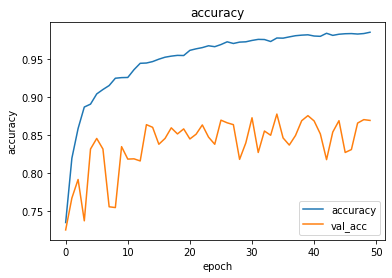

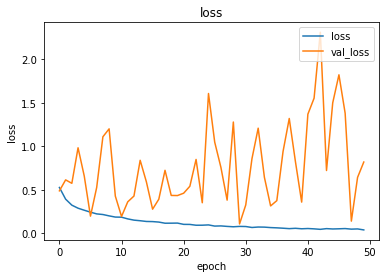

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

def plot_acc_loss(history):
    # 精度の推移をプロット
    plt.plot(history.history['accuracy'],"-",label="accuracy")
    plt.plot(history.history['val_accuracy'],"-",label="val_acc")
    plt.title('accuracy')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(loc="lower right")
    plt.show()

    # 損失の推移をプロット
    plt.plot(history.history['loss'],"-",label="loss",)
    plt.plot(history.history['val_loss'],"-",label="val_loss")
    plt.title('loss')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(loc='upper right')
    plt.show()
    
# 損失と精度をグラフに出力
plot_acc_loss(history)

In [ ]:
predictions > 0.6
type(predictions)
predictions.shape

(624, 1)

##第７章　Visual Predictive Check

In [13]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.applications.vgg16 import VGG16
from keras.models import Sequential, Model
from keras.layers import Input, Activation, Dropout, Flatten, Dense
from keras.preprocessing import image
import numpy as np
from keras.models import load_model


def predictBreakHisVGG16(file):
    '''
    画像を読み込んでVGG16とFC層で予測する
    file：対象の画像のディレクトリ
    '''
    img_h, img_w =400, 400
    channels = 3
    
    model=load_model(os.path.join(result_dir,'breakhis_vgg16model_parameter.h5'))

    model.compile(loss='binary_crossentropy',
                  optimizer = 'adam',
                  metrics=['accuracy'])
    
    filename=file
    
    img = image.load_img(
        filename,
        target_size=(img_h, img_w))
    
    # (height, width, channel)の3階テンソルに変換
    x = image.img_to_array(img)
    # 4階テンソルに変換
    x = np.expand_dims(x, axis=0)
    # RGB値を0.0～1.0の範囲に変換
    x = x / 255.0
    
    # モデルに入力して予測する
    # 入力は1枚の画像なのでx[0]のみ
    pred = model.predict(x[0:])
    # 0.5以上はイヌ、0.5より小さければネコ
    if pred >= 0.5:
        print(pred, '-> Malignantです。')
    else:
        print(pred, '-> Benignです。')

    # 画像を描画
    img = mpimg.imread(file)
    plt.axis('off')
    imgplot = plt.imshow(img)
    plt.show()

### 健康成人由来のX線画像に対して、先ほど構築したモデルで予測する。
『benignです。』と表示されていれば、正解。

20
['SOB_B_A-14-22549G-200-029.png', 'SOB_B_PT-14-21998AB-200-047.png', 'SOB_B_TA-14-15275-400-007.png', 'SOB_B_PT-14-21998AB-40-018.png', 'SOB_B_F-14-21998CD-400-020.png', 'SOB_B_A-14-29960CD-400-010.png', 'SOB_B_A-14-22549G-200-028.png', 'SOB_B_F-14-9133-200-003.png', 'SOB_B_F-14-9133-400-001.png', 'SOB_B_TA-14-3411F-100-002.png', 'SOB_B_A-14-29960CD-40-008.png', 'SOB_B_F-14-21998CD-100-018.png', 'SOB_B_PT-14-21998AB-400-015.png', 'SOB_B_TA-14-16184-40-013.png', 'SOB_B_PT-14-21998AB-400-021.png', 'SOB_B_F-14-21998CD-400-008.png', 'SOB_B_A-14-22549G-400-008.png', 'SOB_B_PT-14-21998AB-100-066.png', 'SOB_B_F-14-21998CD-40-011.png', 'SOB_B_A-14-29960CD-40-014.png']
[[0.9998549]] -> Malignantです。


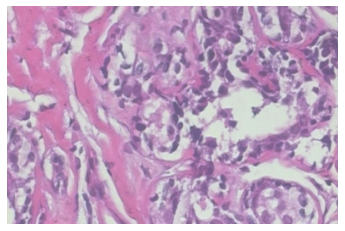

[[0.2477954]] -> Benignです。


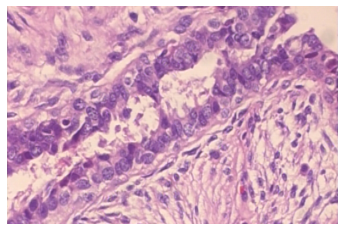

[[0.03672865]] -> Benignです。


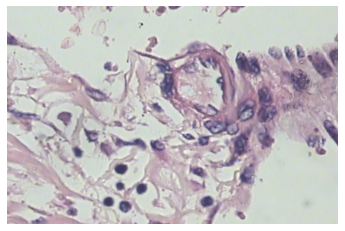

[[0.61046416]] -> Malignantです。


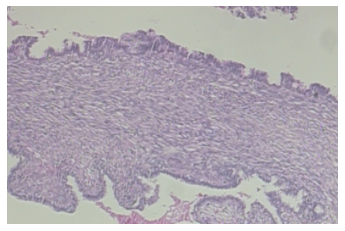

[[4.26669e-06]] -> Benignです。


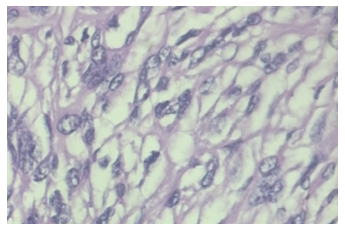

[[2.1388288e-10]] -> Benignです。


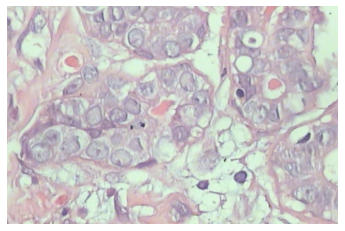

[[0.99894327]] -> Malignantです。


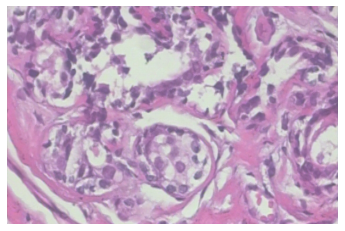

[[4.9805974e-05]] -> Benignです。


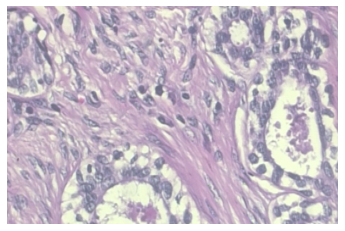

[[0.00048271]] -> Benignです。


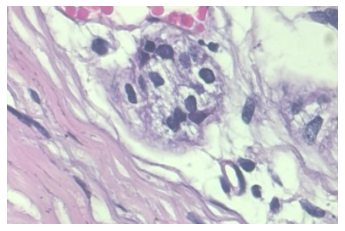

[[1.2016349e-08]] -> Benignです。


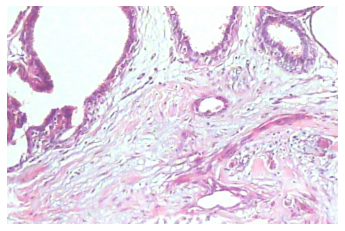

[[3.8805686e-07]] -> Benignです。


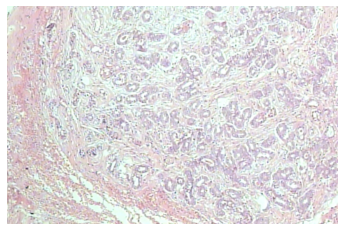

[[0.07541229]] -> Benignです。


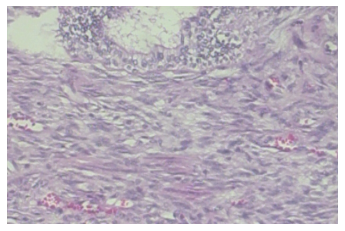

[[6.912478e-07]] -> Benignです。


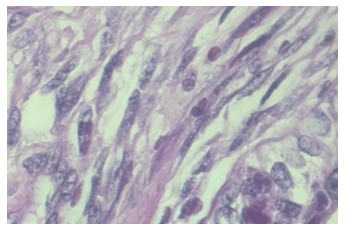

[[6.93397e-05]] -> Benignです。


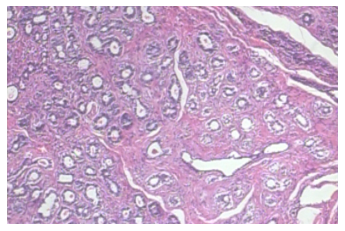

[[0.00010704]] -> Benignです。


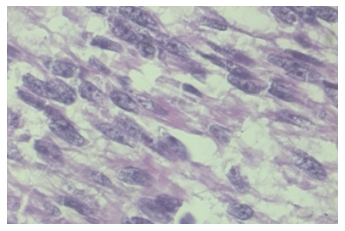

[[0.99967754]] -> Malignantです。


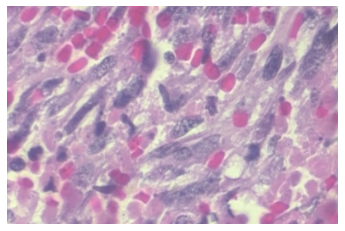

[[0.00228895]] -> Benignです。


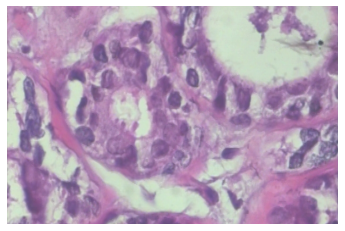

[[0.9999082]] -> Malignantです。


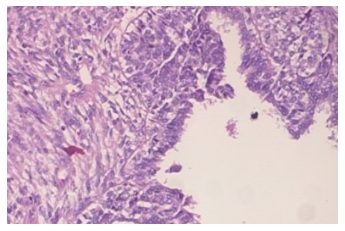

[[0.96234477]] -> Malignantです。


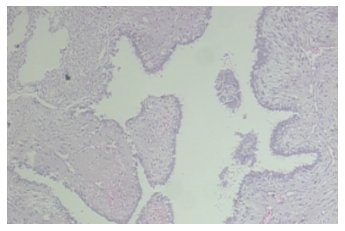

[[4.308088e-09]] -> Benignです。


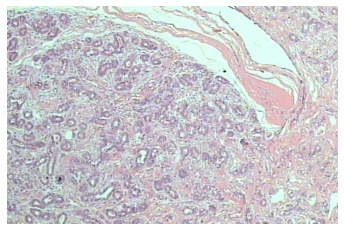

In [14]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # 訓練データのフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # テストデータのフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG16の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
    

normal_files=os.listdir(os.path.join(test_dir,'benign'))
print(len(normal_files))
print(normal_files)

%matplotlib inline


for i in range(len(normal_files)):
  predictBreakHisVGG16(os.path.join(test_dir,'benign',normal_files[i]))




### 乳癌患者由来の画像に対して、先ほど構築したモデルで予測する。
『malignantです。』と表示されていれば、正解。

20
['SOB_M_LC-14-13412-400-024.png', 'SOB_M_DC-14-2980-400-009.png', 'SOB_M_DC-14-2523-100-033.png', 'SOB_M_LC-14-13412-200-011.png', 'SOB_M_DC-14-18650-400-025.png', 'SOB_M_DC-14-6241-200-012.png', 'SOB_M_DC-14-17614-100-004.png', 'SOB_M_DC-14-18650-400-012.png', 'SOB_M_LC-14-15570-200-039.png', 'SOB_M_DC-14-3909-400-002.png', 'SOB_M_DC-14-11951-40-020.png', 'SOB_M_DC-14-2980-200-016.png', 'SOB_M_DC-14-18650-400-016.png', 'SOB_M_DC-14-3909-200-007.png', 'SOB_M_MC-14-13413-400-005.png', 'SOB_M_LC-14-15570-100-025.png', 'SOB_M_DC-14-17915-100-009.png', 'SOB_M_PC-14-15704-100-014.png', 'SOB_M_DC-14-17614-40-038.png', 'SOB_M_PC-14-15687B-400-014.png']
[[1.]] -> Malignantです。


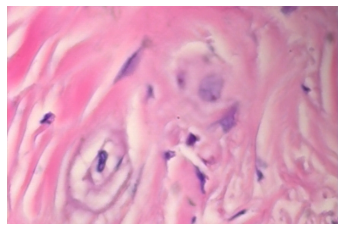

[[0.99999845]] -> Malignantです。


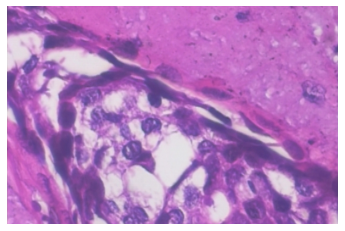

[[1.]] -> Malignantです。


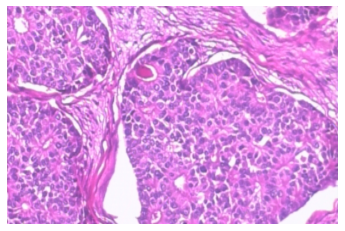

[[0.9992531]] -> Malignantです。


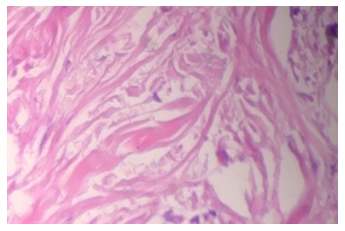

[[0.99999714]] -> Malignantです。


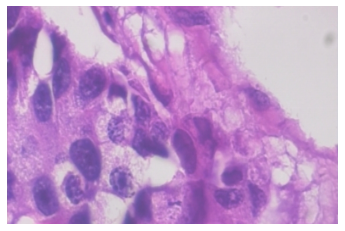

[[0.9999746]] -> Malignantです。


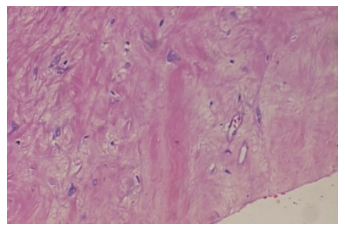

[[1.]] -> Malignantです。


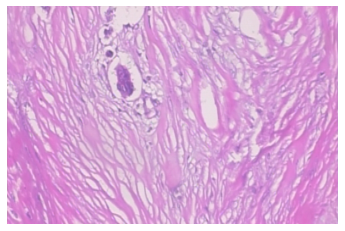

[[0.9999995]] -> Malignantです。


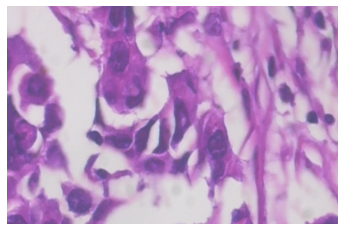

[[0.99999344]] -> Malignantです。


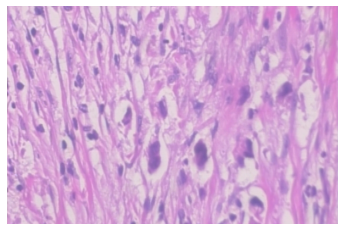

[[0.9987748]] -> Malignantです。


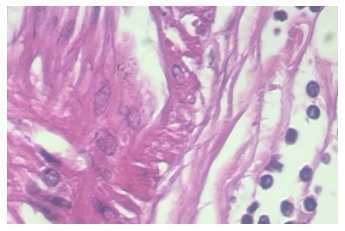

[[0.99999917]] -> Malignantです。


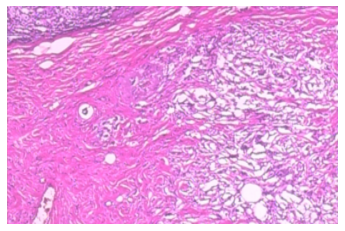

[[0.9999999]] -> Malignantです。


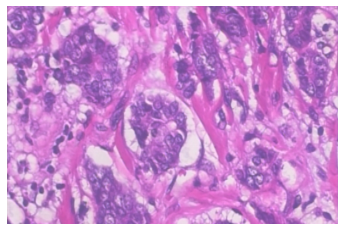

[[1.]] -> Malignantです。


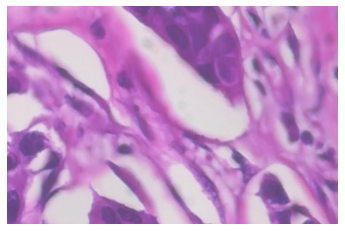

[[0.9999951]] -> Malignantです。


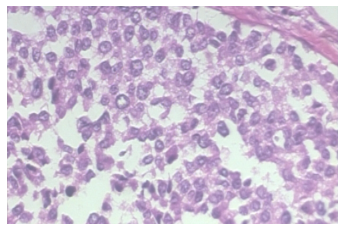

[[0.9960425]] -> Malignantです。


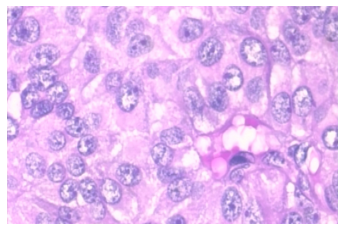

[[0.9943251]] -> Malignantです。


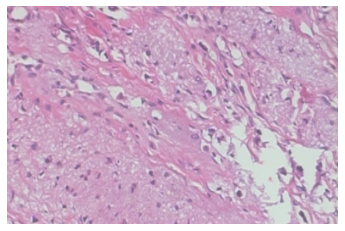

[[0.99998844]] -> Malignantです。


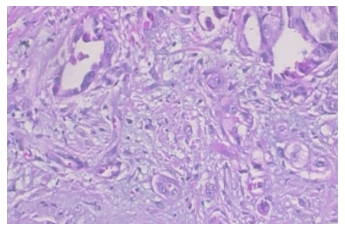

[[1.]] -> Malignantです。


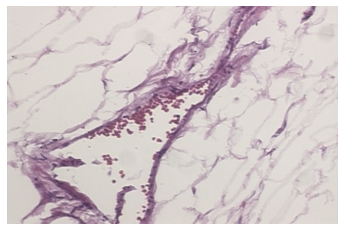

[[1.]] -> Malignantです。


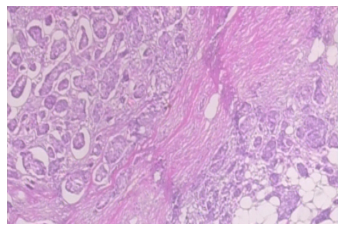

[[0.00960957]] -> Benignです。


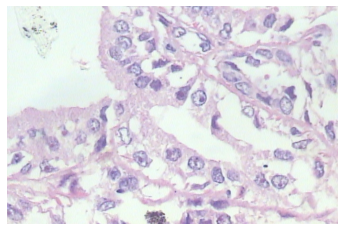

In [16]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

train_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/train' # 訓練データのフォルダー
validation_data_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/data/validation' # テストデータのフォルダー
result_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/results'        # VGG16の出力結果を保存するフォルダー
test_dir = '/content/gdrive/My Drive/Colab Notebooks/BreakHis/test'
    

malignant_files=os.listdir(os.path.join(test_dir,'malignant'))
print(len(malignant_files))
print(malignant_files)

%matplotlib inline


for i in range(len(malignant_files)):
  predictBreakHisVGG16(os.path.join(test_dir,'malignant',malignant_files[i]))

###【考察】  
乳癌患者由来の画像については、２０枚中、１９枚が正解であった。
健康成人由来の画像については、２０枚中、１４枚が正解であった。

BreakHistのデータについての文献を調べても、概ね８０％程度の精度であるため、精度の低さは、データ固有の問題もあると考えられる。

本件で構築したAIシステムの運用としては、まず、AIにて、乳癌である可能性が高いとの判断を示した場合に、その後に、人の判断で、最終判断をするという運用が考えられる。
そうすることで、診断する側の負担が軽減されるものと考えられる。